In [665]:
import os
import time
import math
import copy
import numpy as np
from numpy.linalg import*
from scipy import signal,stats 
import librosa
import importlib
import matplotlib.pyplot as plt
from IPython.display import Audio

import functions as lib_HS 
importlib.reload(lib_HS)
import RoSS_Algorithm as RoSS
importlib.reload(RoSS)
import MIC_Signal_Mod as MIC_Access
importlib.reload(MIC_Access)

<module 'MIC_Signal_Mod' from 'G:\\My Drive\\Personal_Folder\\Python_Codes\\SS_Research\\RoSS_codes\\RoSS_Module_220907\\MIC_Signal_Mod.py'>

In [793]:
## LibriTTS dataset import
N_test = 11
N_len = 1800000
TTS = np.zeros((N_test,N_len))
for i in range(1,N_test+1):

    #TTS_i_raw, fs_MIC = librosa.load('./TTS_dataset/TTS_raw_'+str(i)+'.wav', sr=None)
    TTS_i_raw, fs_MIC = librosa.load('./TTS_dataset/LibriTTS_'+str(i)+'.wav', sr=None)
    
    TTS[i-1,:] = TTS_i_raw[:N_len]


print(np.linalg.norm(TTS,ord=2,axis=1))
Data_scenario = np.array([[0,1,2,3],[2,4,9,1],[0,6,7,8]])
Data_perm = np.array([[0,1,2],[1,2,3],[2,3,4],[3,4,5],[4,5,6],[5,6,7],[6,7,8],[7,8,9],[8,9,10],[9,10,0],[10,0,2],
                     [0,2,4],[2,4,6],[4,6,8],[10,1,3],[1,3,5],[3,5,7],[5,7,9],[7,9,0],[0,3,6],[3,6,9]])
#Data_numsrc = np.array([[10],[10,1],[10,1,2],[10,1,2,3],[10,1,2,3,4]])
Data_numsrc = np.array([[0],[0,1],[0,1,3],[0,1,3,2],[0,1,2,3,4]])

[ 44.03985314  96.18356922  91.63327625  91.35485004 124.37271517
  41.47509867  99.50342169  69.29167727  91.03653142 112.08109081
  81.76619439]


<ipython-input-793-93e4befa60ea>:18: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  Data_numsrc = np.array([[0],[0,1],[0,1,3],[0,1,3,2],[0,1,2,3,4]])


24000

In [472]:
## offline measurement

path = './measurement_data/220908_CSLB1/Sept8th_Male/' 

def data_read_1src(speaker, rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]  

    if rot_ang ==0:
        rot_ang_v = 0
    elif rot_ang >0:
        rot_ang_v = rot_ang
    else:
        rot_ang_v = 180+rot_ang
    

    X_0, fs_MIC = librosa.load(path+'tts'+str(speaker)+'/mic'+str(MIC_pair[0])+'_'+str(rot_ang_v)+'.wav', sr=None)
    X_1, fs_MIC = librosa.load(path+'tts'+str(speaker)+'/mic'+str(MIC_pair[1])+'_'+str(rot_ang_v)+'.wav', sr=None)
    if rot_ang < 0:
        return np.vstack([X_1, X_0])
    return np.vstack([X_0, X_1])

def data_read_2src(rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]  
    if rot_ang ==0:
        rot_ang_v = 0
    elif rot_ang >0:
        rot_ang_v = rot_ang
    else:
        rot_ang_v = 180+rot_ang
   
    X_0, fs_MIC = librosa.load(path+ 'tts1_2/mic'+str(MIC_pair[0])+'_'+str(rot_ang_v)+'.wav', sr=None)
    X_1, fs_MIC = librosa.load(path+ 'tts1_2/mic'+str(MIC_pair[1])+'_'+str(rot_ang_v)+'.wav', sr=None)
    if rot_ang < 0:
        return np.vstack([X_1, X_0])     
    return np.vstack([X_0, X_1])    
    
def data_read_3src(rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]
    if rot_ang ==0:
        rot_ang_v = 0
    elif rot_ang >0:
        rot_ang_v = rot_ang
    else:
        rot_ang_v = 180+rot_ang

    X_0, fs_MIC = librosa.load(path+'tts1_2_3/mic'+str(MIC_pair[0])+'_'+str(rot_ang_v)+'.wav', sr=None)
    X_1, fs_MIC = librosa.load(path+'tts1_2_3/mic'+str(MIC_pair[1])+'_'+str(rot_ang_v)+'.wav', sr=None)
    if rot_ang < 0:
        return np.vstack([X_1, X_0]) 
    return np.vstack([X_0, X_1])

def data_read_4src(rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]
    if rot_ang ==0:
        rot_ang_v = 0
    elif rot_ang >0:
        rot_ang_v = rot_ang
    else:
        rot_ang_v = 180+rot_ang

    X_0, fs_MIC = librosa.load(path+'tts1_2_3_4/mic'+str(MIC_pair[0])+'_'+str(rot_ang_v)+'.wav', sr=None)
    X_1, fs_MIC = librosa.load(path+'tts1_2_3_4/mic'+str(MIC_pair[1])+'_'+str(rot_ang_v)+'.wav', sr=None)
    if rot_ang < 0:
        return np.vstack([X_1, X_0]) 
    return np.vstack([X_0, X_1])

'''

def data_read_3src(rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]  
    if rot_ang == np.round(rot_ang):
        rot_ang = int(rot_ang)
    X_0, fs_MIC = librosa.load('./measurement_data/220215_Park/tts1_2_3/mic'
                               +str(MIC_pair[0])+'_'+str(rot_ang)+'.wav', sr=None)
    X_1, fs_MIC = librosa.load('./measurement_data/220215_Park/tts1_2_3/mic'
                               +str(MIC_pair[1])+'_'+str(rot_ang)+'.wav', sr=None)
    return np.vstack([X_0, X_1])

def data_read_4src(rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]  
    if rot_ang == np.round(rot_ang):
        rot_ang = int(rot_ang)
    X_0, fs_MIC = librosa.load('./measurement_data/220215_Park/tts1_2_3_4/mic'
                               +str(MIC_pair[0])+'_'+str(rot_ang)+'.wav', sr=None)
    X_1, fs_MIC = librosa.load('./measurement_data/220215_Park/tts1_2_3_4/mic'
                               +str(MIC_pair[1])+'_'+str(rot_ang)+'.wav', sr=None)
    return np.vstack([X_0, X_1])

'''

"\n\ndef data_read_3src(rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]  \n    if rot_ang == np.round(rot_ang):\n        rot_ang = int(rot_ang)\n    X_0, fs_MIC = librosa.load('./measurement_data/220215_Park/tts1_2_3/mic'\n                               +str(MIC_pair[0])+'_'+str(rot_ang)+'.wav', sr=None)\n    X_1, fs_MIC = librosa.load('./measurement_data/220215_Park/tts1_2_3/mic'\n                               +str(MIC_pair[1])+'_'+str(rot_ang)+'.wav', sr=None)\n    return np.vstack([X_0, X_1])\n\ndef data_read_4src(rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]  \n    if rot_ang == np.round(rot_ang):\n        rot_ang = int(rot_ang)\n    X_0, fs_MIC = librosa.load('./measurement_data/220215_Park/tts1_2_3_4/mic'\n                               +str(MIC_pair[0])+'_'+str(rot_ang)+'.wav', sr=None)\n    X_1, fs_MIC = librosa.load('./measurement_data/220215_Park/tts1_2_3_4/mic'\n                               +str(MIC_pair[1])+'_'+str(rot_ang)+'.wav', sr=None

In [663]:
class RoSS_Module:

    def __init__(self):
        self.AoA_sweep = np.arange(-180,200,0.1) ## Sweep AoA parameter
        self.vp = 343
        self.hist_save = []
        self.ITD_score_save = []
        self.AoA_spectrum_save = []
        self.AoA_est_save = []
    
    
    def get_MIC_sim(self,SigVec, Angle, rot_ang, fs_MIC, SNR, vp, d, Range, 
                                 Room_len, z, T_reverb, nsample, dim, order):
        X, _ = MIC_Access.MixGen_RIR(SigVec, Angle[:K], rot_ang, fs_MIC, SNR, vp, d, Range, 
                                     Room_len, z, T_reverb, nsample, dim, order)
        return X
    
    def get_MIC_sim_single(self, SigVec, Angle, Angle_rot, fs_true, SNR, vp, d, Range, 
                           Room_len, z, T_reverb, nsample, dim, order):
        X, _ = MIC_Access.MixGen_RIR_single(SigVec, Angle, Angle_rot, fs_true, SNR, vp, d, Range, 
                                            Room_len, z, T_reverb, nsample, dim, order)
        return X    
    
    
    def get_MIC_meas(self, K, speaker, rot_ang, MIC_pair, N_len, count):
        if K==1:
            X = data_read_1src(speaker,rot_ang,MIC_pair)[:,N_len*count:N_len*count+N_len]
        elif K==2:
            X = data_read_2src(rot_ang,MIC_pair)[:,N_len*count:N_len*count+N_len]
        elif K==3:
            X = data_read_3src(rot_ang,MIC_pair)[:,N_len*count:N_len*count+N_len]
        elif K==4:
            X = data_read_4src(rot_ang,MIC_pair)[:,N_len*count:N_len*count+N_len]
        return X
    
    def get_ITD_score(self, X, fs_MIC, d, rot_ang, N_fft=1024, p=1, q=0,  smooth=7):
        N_hop = int(0.25*N_fft)
        hist_A, A_1d, hist_X, hist_Y = RoSS.getHist(X, fs_MIC, N_fft, N_hop,p,q,d,smooth) 
        ITD_score = (A_1d/np.max(A_1d))[lib_HS.find_closest(hist_X, lib_HS.ITD_cosine(np.array([rot_ang]), 
                                                            self.AoA_sweep,self.vp, d, fs_MIC)).squeeze()]
        self.hist_save.append(A_1d/np.max(A_1d))
        self.ITD_score_save.append(ITD_score)
        
    
    def get_AoA(self, smooth_N=150, prom=0.9):
        AoA_spectrum = np.product(np.array(self.ITD_score_save),axis = 0)
        AoA_spectrum = AoA_spectrum/np.max(AoA_spectrum)
        self.AoA_spectrum_save.append(AoA_spectrum)
        
        AoA_spectrum_smooth = lib_HS.smooth(AoA_spectrum,smooth_N)
        plt.figure()
        plt.plot(self.AoA_sweep, np.log10(AoA_spectrum_smooth))
        plt.show()
        peaks, _ = signal.find_peaks(np.log10(AoA_spectrum_smooth), prominence=prom)
        #peak_prom = signal.peak_prominences(np.log10(AoA_spectrum_smooth), peaks, wlen=None)[0]

        Angle_est = -np.sort(-self.AoA_sweep[peaks])
        self.AoA_est_save.append(Angle_est)
        print(Angle_est)
        return Angle_est
    
    def run_IVA(self, X, fs_MIC=16000, N_fft=512, lr=0.5, maxiter=300, tol=1e-6):
        ## IVA

        N_hop = int(0.25*N_fft)

        y_IVA, _, _ = RoSS.ConvBSS_IVA_NG(X, fs_MIC, N_fft, N_hop, None, lr, maxiter, tol)


        return y_IVA

    def run_ICA(self, X, fs_MIC=16000, N_fft=512):
        ## IVA

        N_hop = int(0.25*N_fft)
        y_ICA, _, _ = RoSS.ConvBSS_JadeICA(X, fs_MIC,N_fft, N_hop, 2, 2, None)


        return y_ICA    
    
    def run_DUET(self, X, d, fs_MIC = 16000, N_fft=1024, prom=0.9, p=1, q=0, smooth=7):
        ## DUET

        N_hop = int(0.25*N_fft)

        y_D, peakdelta, hist_A, A_1d= RoSS.DUET(X, fs_MIC, N_fft, N_hop, p, q,d,smooth, prom, None, 0 , 0)
        #plt.figure(i)
        #plt.plot(hist_X,A_1d)
        #plt.show()

        AoA_D=np.arccos(-1*(vp/d)*lib_HS.val_clip(peakdelta/fs_MIC,d,vp))*180/np.pi

        print('AoA_est = ',AoA_D) 
        return y_D

    

In [800]:
############# MIC parameter
M = 2
#MIC_pair, d = [1, 4], 0.1
MIC_pair, d = [2,3], 0.05
#MIC_pair, d = [6,5], 0.05
#d = 0.1 ## 10 cm 

############# Room parameter
Range = 2.5          # in meter
Room_len = 10      # in meter
z = 1000
T_reverb = 0.45    ## in second
nsample = 4096
dim = 2
order = 0
vp = 343


############# Sim Parameter
Angle = [170, 70, -50, -120]
#Angle = [120, 0, -90, -150]
SNR = 15
#################################

In [769]:
## Real-time Measurement func
fs_MIC = 16000
#path = './measurement_data/220908_CSLB1/Sept8th_AoA/continuous_mixed_25'  ## K = 3
#path = './measurement_data/220908_CSLB1/Sept8th_AoA/continuous_male_15'  ## K = 3
#path = './measurement_data/220908_CSLB1/Sept8th_AoA/continuous_female_10'  ## K = 3
#path = './measurement_data/220908_CSLB1/Sept8th_AoA/K_4_continuous_mixed_15'  ## K = 4
path = './measurement_data/220908_CSLB1/Sept8th_ss/SS_mixed1' ## K = 3
#path = './measurement_data/220908_CSLB1/Sept8th_ss/SS_mixed2' ## K = 3
def data_read_realtime(rot_ang, MIC_pair):  ### MIC_pair: [1 , 4] or [2, 3] or [6, 5]
    if rot_ang ==0:
        rot_ang_v = 0
    elif rot_ang >0:
        rot_ang_v = rot_ang
    else:
        rot_ang_v = 180+rot_ang

    X_0, fs_MIC = librosa.load(path+'/mic'+str(MIC_pair[0])+'_'+str(rot_ang_v)+'.wav', sr=None)
    X_1, fs_MIC = librosa.load(path+'/mic'+str(MIC_pair[1])+'_'+str(rot_ang_v)+'.wav', sr=None)
    if rot_ang < 0:
        return np.vstack([X_1, X_0]) 
    return np.vstack([X_0, X_1])

fmax [Hz] :  3430.0

------start------
Count: 0
IMU rotation: 10


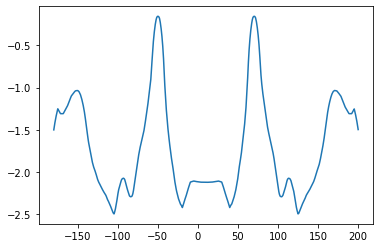

[ 70.  -49.9]
[ 70.  -49.9]
1 iterations: Objective= -0.3205759807835467 , dObj= 0.36751132881820703
21 iterations: Objective= -2.142370319844993 , dObj= 0.0013337114652371973
41 iterations: Objective= -2.1545054191736206 , dObj= 0.0002571614196327232
61 iterations: Objective= -2.1567767228605823 , dObj= 3.22944002042469e-05
Converged

------start------
Count: 1
IMU rotation: 30


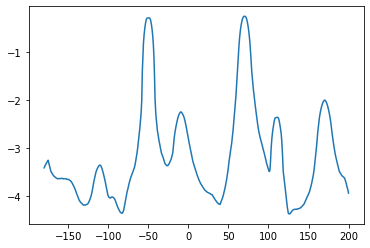

[ 70.  -49.8]
[ 70.  -49.8]
1 iterations: Objective= -0.3133410431059908 , dObj= 0.3642697955404891
21 iterations: Objective= -2.001501791600829 , dObj= 0.0003913983062675541
41 iterations: Objective= -2.025666332781455 , dObj= 0.0017101166385127264
61 iterations: Objective= -2.0406488603543074 , dObj= 3.748563612315792e-05
81 iterations: Objective= -2.0409487831373725 , dObj= 5.165640655668824e-06
Converged

------start------
Count: 2
IMU rotation: 55


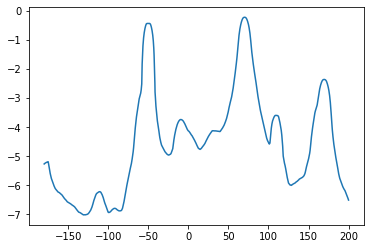

[169.4  70.4 -49.9]
[169.4  70.4 -49.9]
1 iterations: Objective= -0.31131309719443284 , dObj= 0.36336231781860473
21 iterations: Objective= -1.9725426284590086 , dObj= 0.0002269488077395465
41 iterations: Objective= -1.9868695740148583 , dObj= 0.0006989810343902558
61 iterations: Objective= -1.9964140225941642 , dObj= 3.169423957172235e-05
81 iterations: Objective= -1.9995656535542767 , dObj= -7.304399047169952e-06
101 iterations: Objective= -1.9997152014156199 , dObj= 7.649374918328178e-05
121 iterations: Objective= -1.999720811144952 , dObj= 5.5140465959668816e-05
141 iterations: Objective= -1.9997350250713077 , dObj= 4.4132319427347966e-05
161 iterations: Objective= -1.9997400409764623 , dObj= 3.543560612451202e-05
181 iterations: Objective= -1.999738627766412 , dObj= 2.6956143920342512e-05
201 iterations: Objective= -1.999727831748471 , dObj= 1.9323304601748248e-05
221 iterations: Objective= -1.999719026706502 , dObj= 1.4085346997871895e-05
241 iterations: Objective= -1.99971508910

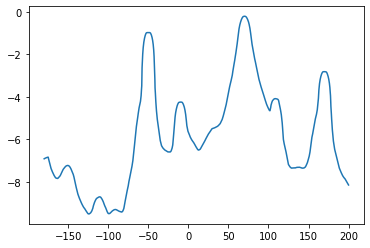

[169.4  70.   -9.3 -49.9]
[169.4  70.   -9.3 -49.9]
1 iterations: Objective= -0.3125229701574006 , dObj= 0.363890924463252
21 iterations: Objective= -1.9905313444746626 , dObj= 0.001613413010227882
41 iterations: Objective= -2.0313246834051224 , dObj= 0.00011686292964352418
61 iterations: Objective= -2.030563030833213 , dObj= -3.8214069274289386e-05
81 iterations: Objective= -2.030458022060899 , dObj= 3.69954559484853e-05
101 iterations: Objective= -2.030449852801369 , dObj= 1.948520057615255e-05
121 iterations: Objective= -2.0304413506514827 , dObj= 6.771452532028377e-06
Converged

------start------
Count: 4
IMU rotation: 120


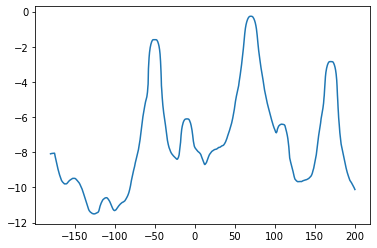

[169.6  70.   -9.5 -49.9]
[169.6  70.   -9.5 -49.9]
1 iterations: Objective= -0.3148460732677612 , dObj= 0.36493569134449555
21 iterations: Objective= -2.0276320085281982 , dObj= 0.0023496584582871627
41 iterations: Objective= -2.06602131224454 , dObj= 0.00012560072363099195
61 iterations: Objective= -2.0651343465133776 , dObj= 2.9646105120573196e-05
81 iterations: Objective= -2.0650399354590006 , dObj= -1.783219170947703e-05
101 iterations: Objective= -2.065027413773947 , dObj= -1.7954254948104875e-05
121 iterations: Objective= -2.0649986496520083 , dObj= -1.758998034873116e-05
141 iterations: Objective= -2.064984234763233 , dObj= -1.5084274441967693e-05
161 iterations: Objective= -2.064984178835628 , dObj= -1.415349186473236e-05
181 iterations: Objective= -2.0649844701254416 , dObj= -1.3385185786862763e-05
201 iterations: Objective= -2.064984720530703 , dObj= -1.2647595566850356e-05
221 iterations: Objective= -2.0649849527830613 , dObj= -1.1938922665599705e-05
241 iterations: Objecti

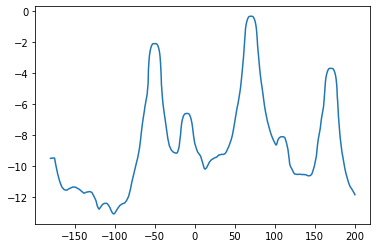

[169.6  70.2  -9.5 -49.9]
[169.6  70.2  -9.5 -49.9]
1 iterations: Objective= -0.3145706071860923 , dObj= 0.3648312292750006
21 iterations: Objective= -2.04805707776967 , dObj= 0.002020918758925294
41 iterations: Objective= -2.0695850231649726 , dObj= 0.00011049882451663606
Converged

------start------
Count: 6
IMU rotation: 175


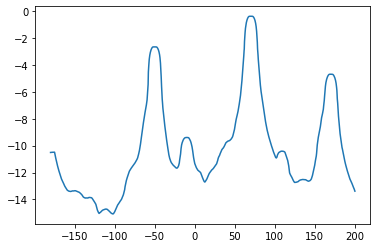

[169.6  70.2  -9.8 -49.9]
[169.6  70.2  -9.8 -49.9]
1 iterations: Objective= -0.315971545124247 , dObj= 0.36544064934317316
21 iterations: Objective= -2.0632009229201334 , dObj= 0.0033187741854612263
41 iterations: Objective= -2.091600344982028 , dObj= 0.00021394881039027425
Converged


In [808]:
## Program Init.

K = 3
speaker = 1
N_len = int(5*fs_MIC)    # Sample length 
#SigVec = np.zeros((K,N_len))

fmax = 0.5*vp/d
print('fmax [Hz] : ', fmax)

## Exploration Step:



#count_iter = 10 ## number of rotation angles

#dtheta_step = 15
rot_ang = 0   ## start angle



#rot_ang_plan = np.array([30,70,55,170])
#rot_ang_plan = np.arange(0,180,10)
rot_ang_plan = np.array([10, 30,55,80,120,150,175])
#rot_ang_plan = np.array([0])
rot_ang_list = []


K_temp = [0]
perm = 2
flag = 0
y_SS = []
Run = RoSS_Module()


mode = 'sim'
#mode = 'meas'
#mode = 'real'

for count, rot_ang in enumerate(rot_ang_plan):

    rot_ang_list.append(rot_ang)
    print('\n------start------')
    print('Count:',count)
    print('IMU rotation:', rot_ang)
    
    if mode == 'sim':
        #SigVec = TTS[Data_numsrc[K-1],N_len*count:N_len*count+N_len]
        SigVec = TTS[Data_scenario[perm][:K], N_len*count:N_len*count+N_len]
        X = Run.get_MIC_sim(SigVec, Angle[:K], rot_ang, fs_MIC, SNR, vp, d, Range, 
                                         Room_len, z, T_reverb, nsample, dim, order)
    if mode == 'meas':
        X = Run.get_MIC_meas(K, speaker, rot_ang, MIC_pair, N_len, count)
    if mode == 'real':
        X = data_read_realtime(rot_ang, MIC_pair)
    X = lib_HS.butter_lowpass_filter(X,fmax,fs_MIC,order=5)
   
    Run.get_ITD_score(X, fs_MIC, d, rot_ang, N_fft=1024, p=1, q=0,  smooth=7)
    print(Run.get_AoA(smooth_N=100, prom=2))
    
    #y_est = Run.run_DUET(X, d, fs_MIC, N_fft=1024, prom=0.1,p=1, q=0, smooth=7)
    y_est = Run.run_IVA(X, fs_MIC, N_fft=512, lr=0.5, maxiter=300, tol=1e-6)
    #y_est = Run.run_ICA(X, fs_MIC, N_fft=512)
    y_SS.append(y_est)

    




In [243]:
### Individual signals:
SigVec_single = []
Sig_each = RoSS_Module()
count = 0
for i in range(3):  
    SigVec_single.append(Sig_each.get_MIC_meas(1, i+1, rot_ang, MIC_pair, N_len, count)[0])


In [357]:
Audio(SigVec_single[2],rate=fs_MIC)

In [809]:
print(rot_ang_plan)
for i in range(len(y_SS)):
    
    print(y_SS[i].shape)

[ 10  30  55  80 120 150 175]
(2, 120000)
(2, 120000)
(2, 120000)
(2, 120000)
(2, 120000)
(2, 120000)
(2, 120000)


In [816]:
Audio(y_SS[4][0], rate=fs_MIC)

In [741]:
Audio(y_SS[2][1], rate=fs_MIC)

In [720]:
perm = 0
Audio(TTS[Data_scenario[perm][2]],rate=fs_TTS)

In [723]:
Audio(y_SS[6][0], rate=fs_MIC)

In [526]:
#Angle_est = Run.get_AoA()
K=3
#Angle_est = [151.9, 94.4, -56.6]
#Angle_truth = [170, 70, -50, -120][:K]
Angle_truth = [120,0, -90, -150][:K]
Angle_est = Angle_truth

print('---Estimation---')
for i in range(len(Angle_est)):
    print('Align Ang for {} : {} [deg]'.format(Angle_est[i],lib_HS.Find_AlignRotAng(Angle_est,i)))
    print(Angle_est - lib_HS.Find_AlignRotAng(Angle_est,i))

print('---Ground Truth---')
for i in range(len(Angle_truth)):
    print('Align Ang for {} : {} [deg]'.format(Angle_truth[i],lib_HS.Find_AlignRotAng(Angle_truth,i)))
    print(Angle_truth - lib_HS.Find_AlignRotAng(Angle_est,i))

---Estimation---
Align Ang for 120 : -45.0 [deg]
[165.  45. -45.]
Align Ang for 0 : 15.0 [deg]
[ 105.  -15. -105.]
Align Ang for -90 : 60.0 [deg]
[  60.  -60. -150.]
---Ground Truth---
Align Ang for 120 : -45.0 [deg]
[165.  45. -45.]
Align Ang for 0 : 15.0 [deg]
[ 105.  -15. -105.]
Align Ang for -90 : 60.0 [deg]
[  60.  -60. -150.]


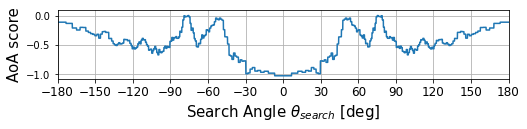

In [11]:
fig = plt.figure(figsize=(7,1.5))
#plt.plot(AoA_sweep, np.log10(ITD_score_prog[6]))
plt.plot(Run.AoA_sweep, np.log10(Run.AoA_spectrum_save[0]))
plt.tight_layout()
#plt.title('AoA = {} deg'.format(AoA), fontsize = 15)
plt.xlabel(r'Search Angle $\theta_{search}$ [deg]', fontsize = 15)
plt.ylabel('AoA score', fontsize = 15)
plt.xlim([-180,180])
plt.ylim([None,0.1])
#plt.yscale('log')
plt.xticks(np.arange(-180, 210, step=30), fontsize = 12)  # Set label locations.
#plt.yticks([])
plt.grid()
plt.show()

In [619]:
Audio(TTS[3],rate=fs_TTS)

In [500]:
import numpy as np
from numpy.fft import fft, ifft, fft2, ifft2, fftshift
 
def cross_correlation_using_fft(x, y):
    f1 = fft(x)
    f2 = fft(np.flipud(y))
    cc = np.real(ifft(f1 * f2))
    return fftshift(cc)
 
# shift &lt; 0 means that y starts 'shift' time steps before x # shift &gt; 0 means that y starts 'shift' time steps after x
def compute_shift(x, y):
    assert len(x) == len(y)
    c = cross_correlation_using_fft(x, y)
    assert len(c) == len(x)
    zero_index = int(len(x) / 2) - 1
    shift = zero_index - np.argmax(c)
    return shift

In [501]:
cross_correlation_using_fft(X[0],X[1])

array([-4.36847451, -3.48947413, -2.26892793, ..., -5.15510122,
       -5.31910802, -4.99244377])

In [502]:
compute_shift(X[0],X[1])

2

In [492]:
#from scipy.signal import fftconvolve
def similarity(template, test):
    corr = signal.fftconvolve(template, test, mode='full')           

    return max(abs(corr))

In [498]:
similarity(X[0],TTS[2])

16.23719384500515